In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
sns.set_theme()
%config InlineBackend.figure_format = 'retina'

from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV,cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score,classification_report,precision_score,recall_score,roc_auc_score,confusion_matrix,roc_curve
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings("ignore")

In [7]:
#read the data into a dataframe and sample 10 records
water_properties_data_frame = pd.read_csv('water_potability.csv')
water_properties_data_frame.sample(10)

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
1346,5.588537,171.333123,17732.240668,5.588614,343.041575,466.445429,13.827755,59.376451,4.373999,0
340,6.848332,159.188050,12837.506063,5.164448,373.991711,558.815567,12.254081,69.772210,4.396605,1
1401,7.615557,204.869974,8403.284552,6.012316,418.309431,311.178955,12.742329,67.282328,4.243134,0
2490,8.860324,233.625145,19550.299680,6.519063,NaN,285.412436,13.093262,25.061904,2.476674,0
511,7.291957,202.329044,21891.677159,7.628747,339.829014,379.270122,7.654956,64.021523,4.237644,0
1366,5.754213,241.602430,31871.291239,7.299302,203.444521,495.945344,22.763707,71.428978,5.920234,0
874,NaN,218.986406,9836.401847,7.064672,328.724289,386.345247,15.547964,57.328116,3.837257,0
2076,8.469537,128.620079,15273.049287,10.725524,NaN,553.346260,16.930868,69.736688,4.149553,0
1984,7.732880,189.509811,47022.745845,8.226725,287.087053,567.722281,14.980054,71.206209,3.510728,1
2137,7.775050,195.178742,22329.740079,6.105130,416.949194,371.615860,10.964183,NaN,4.699483,0


In [8]:
water_properties_data_frame.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


We can see that we have differing non-null values 

In [9]:
water_properties_data_frame.isnull().sum() 

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64

Percent of missing values for each column

In [15]:
data_frame_len = len(water_properties_data_frame)
((water_properties_data_frame.isnull().sum() / data_frame_len) *100).to_frame(name='% of Null Values') 

,% of Null Values
ph,14.987790
Hardness,0.000000
Solids,0.000000
Chloramines,0.000000
Sulfate,23.840049
Conductivity,0.000000
Organic_carbon,0.000000
Trihalomethanes,4.945055
Turbidity,0.000000
Potability,0.000000


In [18]:
water_df = water_properties_data_frame.dropna()
water_df.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000
mean,7.085990,195.968072,21917.441374,7.134338,333.224672,426.526409,14.357709,66.400859,3.969729,0.403282
std,1.573337,32.635085,8642.239815,1.584820,41.205172,80.712572,3.324959,16.077109,0.780346,0.490678
min,0.227499,73.492234,320.942611,1.390871,129.000000,201.619737,2.200000,8.577013,1.450000,0.000000
25%,6.089723,176.744938,15615.665390,6.138895,307.632511,366.680307,12.124105,55.952664,3.442915,0.000000
50%,7.027297,197.191839,20933.512750,7.143907,332.232177,423.455906,14.322019,66.542198,3.968177,0.000000
75%,8.052969,216.441070,27182.587067,8.109726,359.330555,482.373169,16.683049,77.291925,4.514175,1.000000
max,14.000000,317.338124,56488.672413,13.127000,481.030642,753.342620,27.006707,124.000000,6.494749,1.000000


In [19]:
water_df.skew(axis=0,skipna=True).to_frame(name='Skewed Values')

,Skewed Values
ph,0.048947
Hardness,-0.085237
Solids,0.595894
Chloramines,0.012976
Sulfate,-0.046558
Conductivity,0.266869
Organic_carbon,-0.020018
Trihalomethanes,-0.051422
Turbidity,-0.033051
Potability,0.394614


Now that we have trimmed the missing values, we can check out the difference in properties based on Potability

<AxesSubplot: xlabel='Potability', ylabel='Turbidity'>

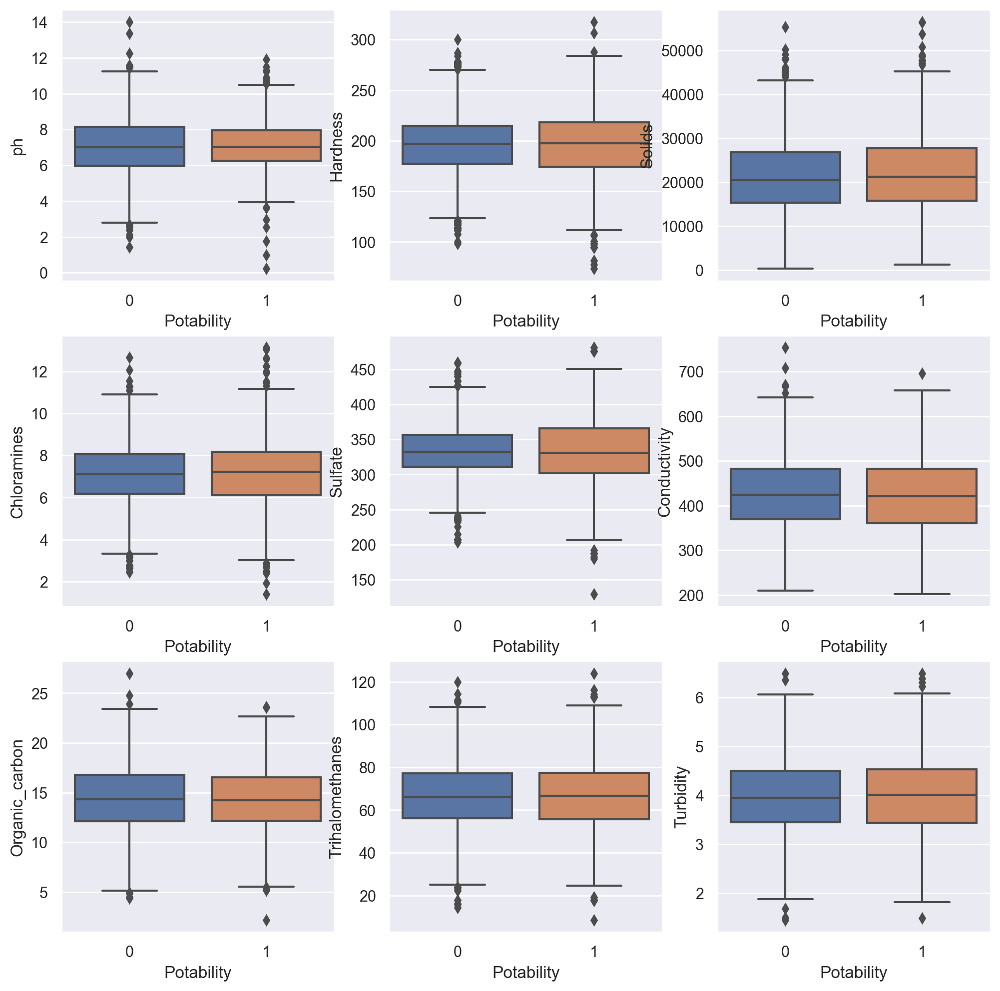

In [30]:
fig, axes = plt.subplots(3, 3, figsize=(12,12))
sns.boxplot(ax=axes[0, 0], data=water_df, x='Potability', y='ph')
sns.boxplot(ax=axes[0, 1], data=water_df, x='Potability', y='Hardness')
sns.boxplot(ax=axes[0, 2], data=water_df, x='Potability', y='Solids')
sns.boxplot(ax=axes[1, 0], data=water_df, x='Potability', y='Chloramines')
sns.boxplot(ax=axes[1, 1], data=water_df, x='Potability', y='Sulfate')
sns.boxplot(ax=axes[1, 2], data=water_df, x='Potability', y='Conductivity')
sns.boxplot(ax=axes[2, 0], data=water_df, x='Potability', y='Organic_carbon')
sns.boxplot(ax=axes[2, 1], data=water_df, x='Potability', y='Trihalomethanes')
sns.boxplot(ax=axes[2, 2], data=water_df, x='Potability', y='Turbidity')

<AxesSubplot: xlabel='Potability', ylabel='Turbidity'>

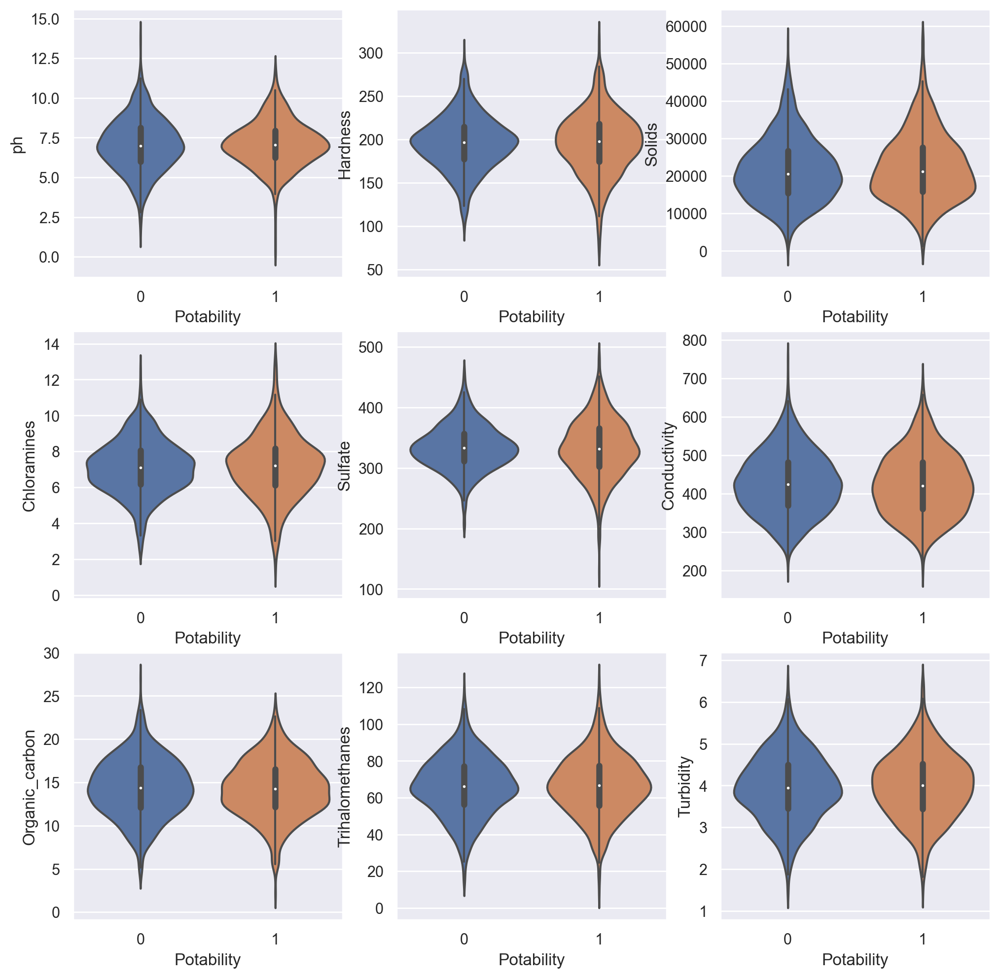

In [31]:
fig, axes = plt.subplots(3, 3, figsize=(12,12))
sns.violinplot(ax=axes[0, 0], data=water_df, x='Potability', y='ph')
sns.violinplot(ax=axes[0, 1], data=water_df, x='Potability', y='Hardness')
sns.violinplot(ax=axes[0, 2], data=water_df, x='Potability', y='Solids')
sns.violinplot(ax=axes[1, 0], data=water_df, x='Potability', y='Chloramines')
sns.violinplot(ax=axes[1, 1], data=water_df, x='Potability', y='Sulfate')
sns.violinplot(ax=axes[1, 2], data=water_df, x='Potability', y='Conductivity')
sns.violinplot(ax=axes[2, 0], data=water_df, x='Potability', y='Organic_carbon')
sns.violinplot(ax=axes[2, 1], data=water_df, x='Potability', y='Trihalomethanes')
sns.violinplot(ax=axes[2, 2], data=water_df, x='Potability', y='Turbidity')

In [32]:
water_df['Potability'].value_counts()

0    1200
1     811
Name: Potability, dtype: int64

These values for potable water represent the following percentage of the dataset

In [36]:
water_df['Potability'].value_counts()[1]/len(water_df) * 100

40.32819492789657

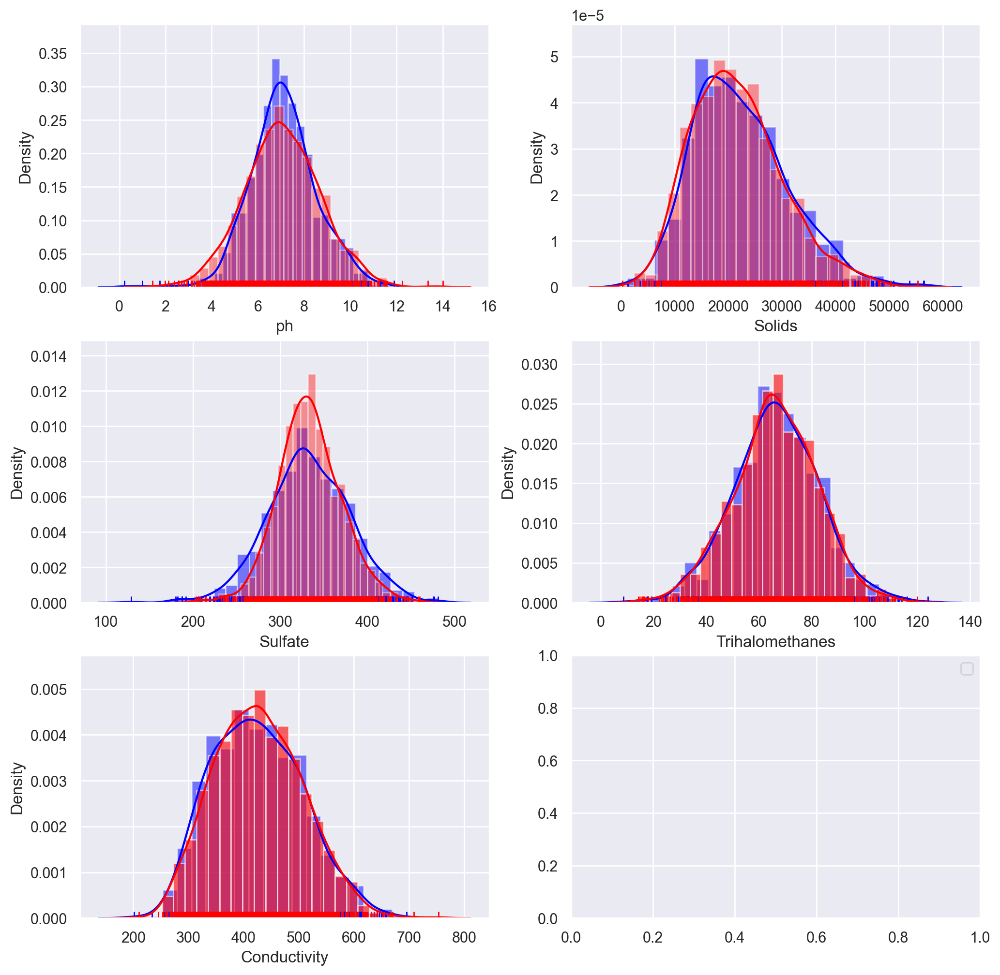

In [45]:
fig, axes = plt.subplots(3, 2, figsize=(12,12))

sns.distplot(water_df['ph'][water_df.Potability==1],ax=axes[0,0],hist=True, rug=True,color='Blue',hist_kws={'alpha':0.50})
sns.distplot(water_df['ph'][water_df.Potability==0],ax=axes[0,0],hist=True, rug=True,color='Red',hist_kws={'alpha':0.40})

sns.distplot(water_df['Solids'][water_df.Potability==1],ax=axes[0,1],hist=True, rug=True,color='Blue',hist_kws={'alpha':0.50})
sns.distplot(water_df['Solids'][water_df.Potability==0],ax=axes[0,1],hist=True, rug=True,color='Red',hist_kws={'alpha':0.40})

sns.distplot(water_df['Sulfate'][water_df.Potability==1],ax=axes[1,0],hist=True, rug=True,color='Blue',hist_kws={'alpha':0.50})
sns.distplot(water_df['Sulfate'][water_df.Potability==0],ax=axes[1,0],hist=True, rug=True,color='Red',hist_kws={'alpha':0.40})

sns.distplot(water_df['Trihalomethanes'][water_df.Potability==1],ax=axes[1,1],hist=True, rug=True,color='Blue',hist_kws={'alpha':0.50})
sns.distplot(water_df['Trihalomethanes'][water_df.Potability==0],ax=axes[1,1],hist=True, rug=True,color='Red',hist_kws={'alpha':0.60})

sns.distplot(water_df['Conductivity'][water_df.Potability==1],ax=axes[2,0],hist=True, rug=True,color='Blue',hist_kws={'alpha':0.50})
sns.distplot(water_df['Conductivity'][water_df.Potability==0],ax=axes[2,0],hist=True, rug=True,color='Red',hist_kws={'alpha':0.60})

plt.legend(['Potability','Non Potability'])

We can make the following observations

<AxesSubplot: >

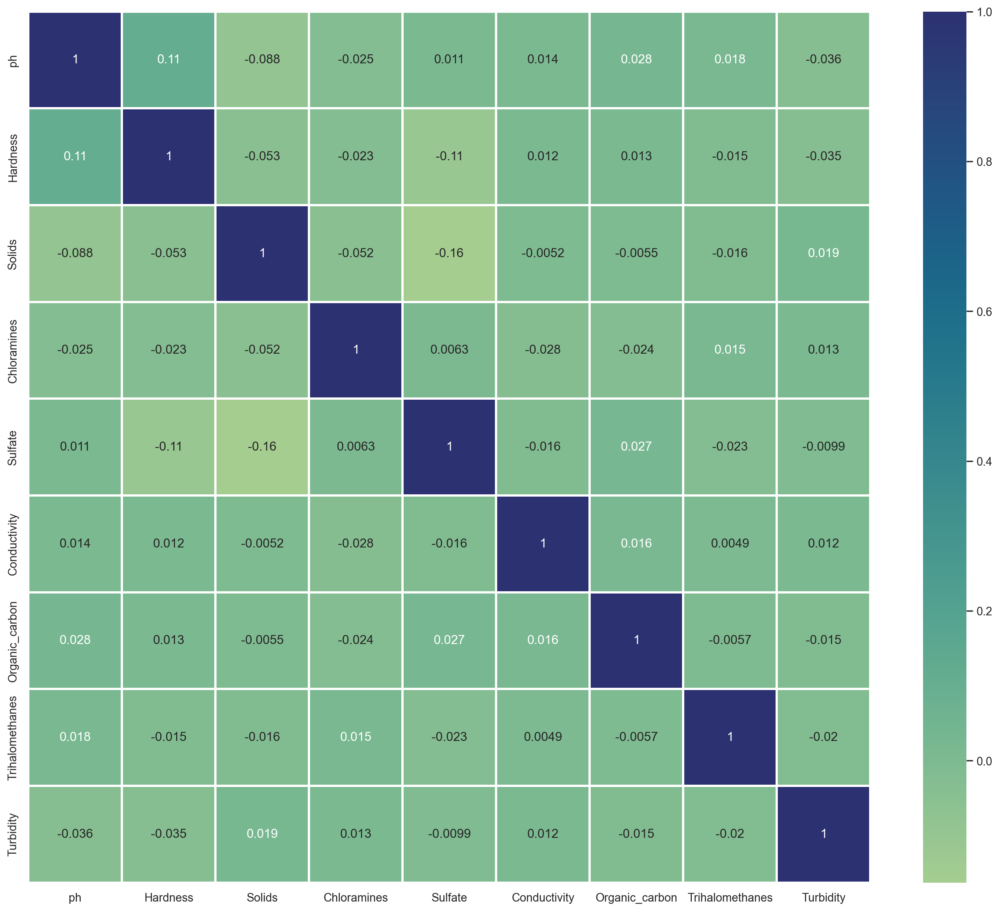

In [42]:
plt.figure(figsize=(18,15))
corr=water_df.iloc[:,:-1].corr()
corr_feat = corr.index
sns.heatmap(water_df[corr_feat].corr(),cmap='crest',annot=True,linewidths=2)

We can see that there no such independent variable that is highly correlated to another independent variable

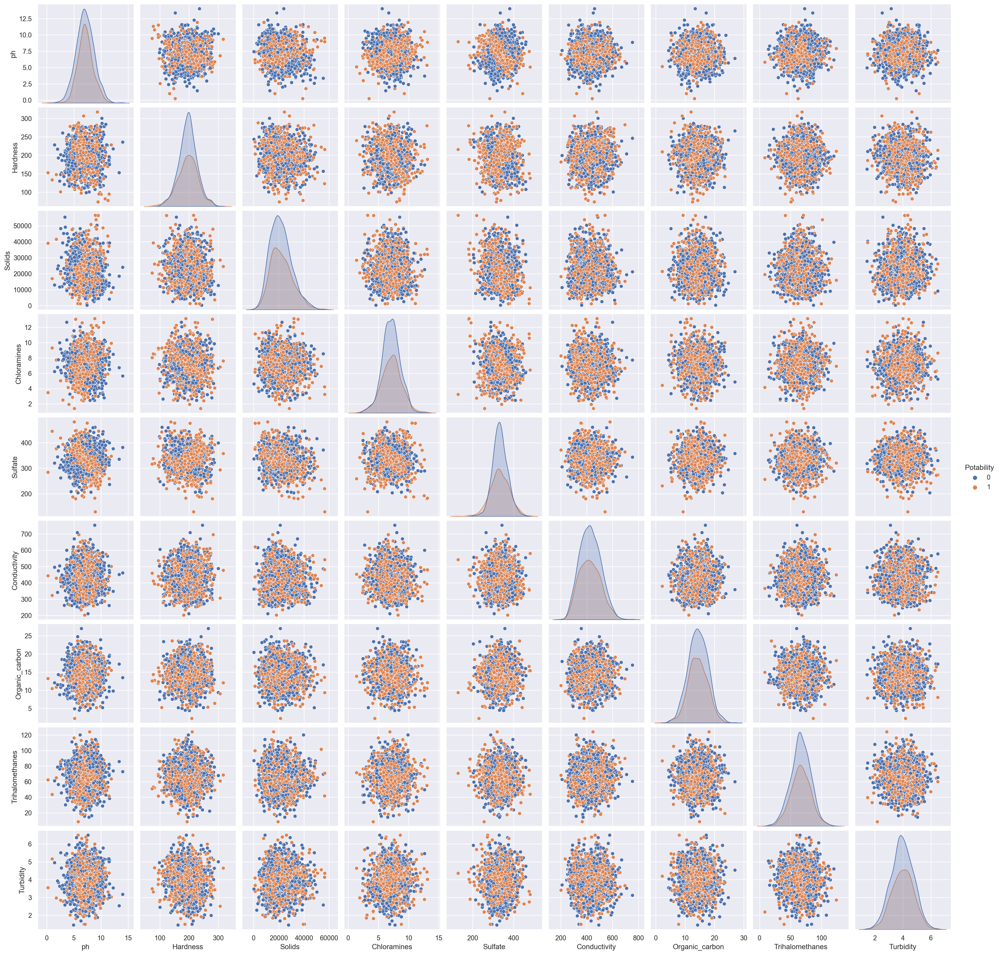

In [46]:
sns.pairplot(water_df,hue='Potability')

In [47]:
water_df.skew()

ph                 0.048947
Hardness          -0.085237
Solids             0.595894
Chloramines        0.012976
Sulfate           -0.046558
Conductivity       0.266869
Organic_carbon    -0.020018
Trihalomethanes   -0.051422
Turbidity         -0.033051
Potability         0.394614
dtype: float64

In [ ]:
#TODO add here normalization in another commit

In [53]:
water_df_no_label = water_df.loc[:,water_df.columns != "Potability"]
water_df_no_label.head()

water_df_label = water_df['Potability']

In [54]:
x_train,x_test,y_train,y_test=train_test_split(water_df_no_label,water_df_label,test_size=0.20,random_state=45)
scaler = StandardScaler().fit(x_train)
x_train = scaler.transform(x_train)
x_test = scaler.transform(x_test)

MLP

In [55]:
mlp = MLPClassifier(max_iter=600,random_state=5)

In [56]:
mlp.fit(x_train,y_train)

MLPClassifier(max_iter=600, random_state=5)

In [57]:
mlp.score(x_test,y_test)

0.7146401985111662

In [60]:
y_pred_train_mlp= mlp.predict(x_train)
y_pred_test_mlp= mlp.predict(x_test)

Text(175.7500000000001, 0.5, 'Actual')

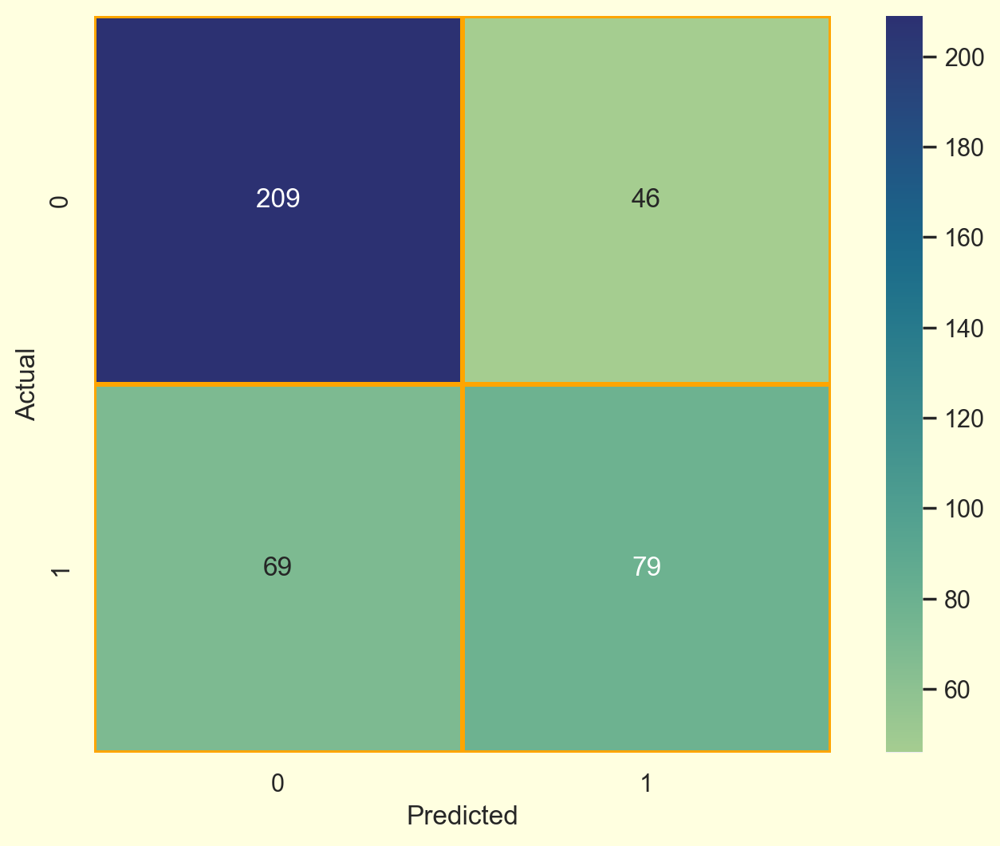

In [62]:


plt.figure(figsize=(9,6),facecolor='lightyellow')
sns.heatmap(confusion_matrix(y_test,y_pred_test_mlp),annot=True,linewidths=2,cmap='crest',fmt='.3g',linecolor='orange',square=True)
plt.xlabel('Predicted')
plt.ylabel('Actual')

In [63]:
print(classification_report(y_test,y_pred_test_mlp))

              precision    recall  f1-score   support

           0       0.75      0.82      0.78       255
           1       0.63      0.53      0.58       148

    accuracy                           0.71       403
   macro avg       0.69      0.68      0.68       403
weighted avg       0.71      0.71      0.71       403

